In [1]:
#import hdstats
import joblib

%matplotlib inline

import os
import datacube
import numpy as np
import pandas as pd
import xarray as xr
import rioxarray  # activate the rio accessor

import datetime as dt
import matplotlib.pyplot as plt

import sys
sys.path.insert(1, '../Tools/')
from dea_tools.temporal import xr_phenology, temporal_statistics
from dea_tools.datahandling import load_ard
from dea_tools.bandindices import calculate_indices
from dea_tools.plotting import display_map, rgb
from dea_tools.dask import create_local_dask_cluster

import hdstats

In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Create local dask cluster to improve data load time
client = create_local_dask_cluster(return_client=True)


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /user/john.burley@anu.edu.au/proxy/8787/status,
Dashboard: /user/john.burley@anu.edu.au/proxy/8787/status,Workers: 1
Total threads: 2,Total memory: 12.21 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:36891,Workers: 1
Dashboard: /user/john.burley@anu.edu.au/proxy/8787/status,Total threads: 2
Started: Just now,Total memory: 12.21 GiB
Comm: tcp://127.0.0.1:35317,Total threads: 2
Dashboard: /user/john.burley@anu.edu.au/proxy/46483/status,Memory: 12.21 GiB
Nanny: tcp://127.0.0.1:42385,


In [3]:
## Connect to datacube

dc = datacube.Datacube(app='Vegetation_phenology')

In [4]:
# Define area of interest

# # 186 Milgadara Rd, Barwang NSW: -34.38904277303204, 148.46949938279096
# Yelkin -33.47904684379098, 146.3094839864518
# Boomahnoomoona -36.11965805095775, 146.08472404116773
# Adam O'tool site: -33.5040228817206, 148.6385170105664
# Grant Sims multispecies cover crop experiment sites -36.22746736927963, 144.40088864017818
lat = -36.22746736927963
lon = 144.40088864017818
lon_buffer = 0.05
lat_buffer = 0.05

# Set the range of dates for the analysis
time_range = ('2017-01-01', '2024-03-01') # when is the earliest? 2016?

# Combine central lat,lon with buffer to get area of interest
lat_range = (lat-lat_buffer, lat+lat_buffer)
lon_range = (lon-lon_buffer, lon+lon_buffer)

display_map(x=lon_range, y=lat_range)


In [5]:
# Create a reusable query
query = {
    'y': lat_range,
    'x': lon_range,
    'time': time_range,
    'measurements': ['nbart_red', 'nbart_green', 'nbart_blue', 'nbart_nir_1'],
    'resolution': (-20, 20),
    'output_crs': 'epsg:6933',
    'group_by':'solar_day'
}

# Load available data from Sentinel-2
ds = load_ard(
    dc=dc,
    products=['ga_s2am_ard_3', 'ga_s2bm_ard_3'],
    cloud_mask='s2cloudless',
    min_gooddata=0.9,
    **query,
)

# Shut down Dask client now that we have loaded the data we need
client.close()

# Preview data
ds


Finding datasets
    ga_s2am_ard_3
    ga_s2bm_ard_3
Counting good quality pixels for each time step using s2cloudless


/env/lib/python3.10/site-packages/rasterio/warp.py:344: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  _reproject(


Filtering to 216 out of 475 time steps with at least 90.0% good quality pixels
Applying s2cloudless pixel quality/cloud mask
Loading 216 time steps


2024-03-19 23:13:49,327 - distributed.nanny - WARNING - Worker process still alive after 3.1999989318847657 seconds, killing


<xarray.Dataset>
Dimensions:      (time: 216, y: 518, x: 483)
Coordinates:
  * time         (time) datetime64[ns] 2017-01-11T00:24:25.608000 ... 2024-02...
  * y            (y) float64 -4.321e+06 -4.321e+06 ... -4.332e+06 -4.332e+06
  * x            (x) float64 1.393e+07 1.393e+07 ... 1.394e+07 1.394e+07
    spatial_ref  int32 6933
Data variables:
    nbart_red    (time, y, x) float32 1.421e+03 1.457e+03 ... 1.464e+03 1.5e+03
    nbart_green  (time, y, x) float32 1.01e+03 1.029e+03 ... 1.018e+03 1.037e+03
    nbart_blue   (time, y, x) float32 736.0 715.0 764.0 ... 738.0 764.0 729.0
    nbart_nir_1  (time, y, x) float32 2.032e+03 2.039e+03 ... 2.31e+03 2.377e+03
Attributes:
    crs:           epsg:6933
    grid_mapping:  spatial_ref

In [ ]:
# # Plot a row of thumbnails for each year. 
# # This way, the years are ROUGHLY aligned for visual inspection, but the size of thumbnails varies depending on n.frames. 

# #for i in ['2017', '2018', '2019', '2020', '2021', '2022', '2023']:
# for i in ['2019', '2020']:
#     year_to_plot = i
#     n_frames=ds.sel(time=year_to_plot).coords['time'].values.shape[0]
#     print('Year:', year_to_plot)
#     print('n. frames:', n_frames)
#     rgb(ds.sel(time=year_to_plot), index=[*range(0, n_frames, 1)], col_wrap=n_frames)



### Now implement Dale's code:


In [6]:
data = ds[list(ds.data_vars)].to_array().transpose('y', 'x','variable', 'time').values.astype(np.float32)
data[data == 0] = np.nan
data /= 10000.

dayofyear = np.array(ds.time.dt.dayofyear)
ts = dayofyear/365.

print(data.shape)

(518, 483, 4, 216)


In [7]:
# calculate ndvi first using the missing and non missing data
obs_ndvi = (data[:,:,3,:]-data[:,:,0,:])/(data[:,:,3,:]+data[:,:,0,:])


In [8]:
print('number of missing pixels to be dealt with:', np.count_nonzero(np.isnan(data)))
data = hdstats.completion(data, s=2)


number of missing pixels to be dealt with: 2252684


In [9]:
np.count_nonzero(np.isnan(data))


0

In [10]:
# calculate indices from the 'completed' data

ndvi = (data[:,:,3,:]-data[:,:,0,:])/(data[:,:,3,:]+data[:,:,0,:])
ndwi = (data[:,:,1,:]-data[:,:,3,:])/(data[:,:,1,:]+data[:,:,3,:]) # w = water. (g-nir)/(g+nir)



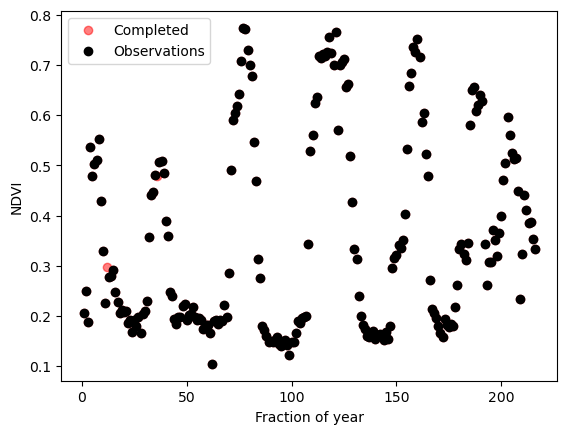

In [11]:
yloc, xloc = data.shape[0]//4, data.shape[1]//4

# specify a time vector
ts = dayofyear/365. # ts x-axis as day of year
# OR
ts = np.array(range(1,data.shape[3]+1)) # ts x-axis as sequential obs days.  

plt.plot(ts, ndvi[yloc,xloc,:], 'ro', alpha=0.5, label='Completed')
plt.plot(ts, obs_ndvi[yloc,xloc,:], 'ko', label='Observations')
plt.xlabel('Fraction of year')
plt.ylabel('NDVI')
plt.legend();

In [12]:
yloc

129

In [13]:
gm = hdstats.nangeomedian_pcm(data)


Automatically using 64 threads.


(518, 483, 4)


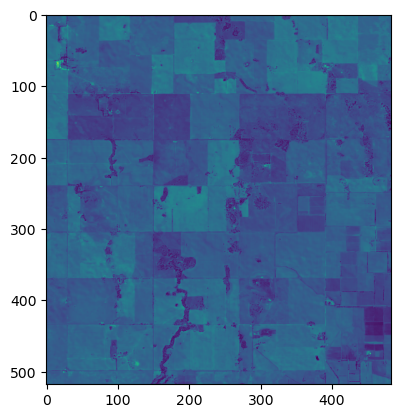

In [14]:
print(gm.shape)
plt.imshow(gm[:,:,0])

(518, 483, 4)


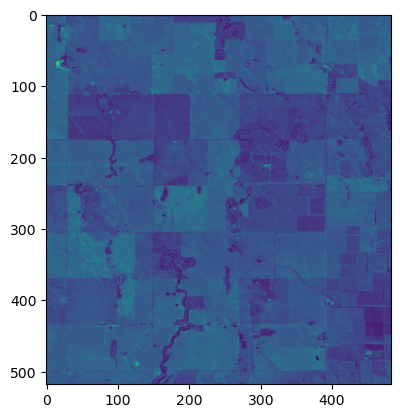

In [15]:
mm = np.nanmean(data, axis=3)
print(mm.shape)
plt.imshow(mm[:,:,0])

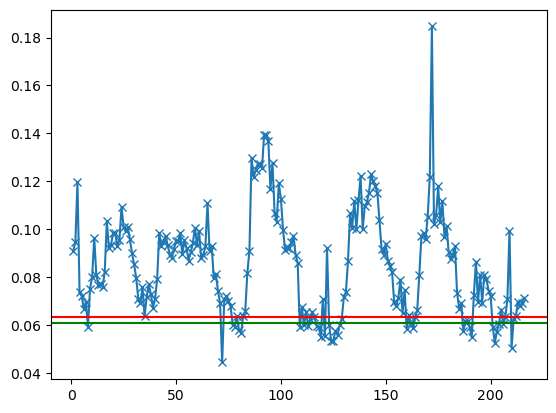

In [16]:

plt.plot(ts, data[yloc,xloc,1,:], marker='x')
plt.axhline(gm[yloc,xloc,2], c='r')
plt.axhline(mm[yloc,xloc,2], c='g')

Automatically using 64 threads.
Automatically using 64 threads.


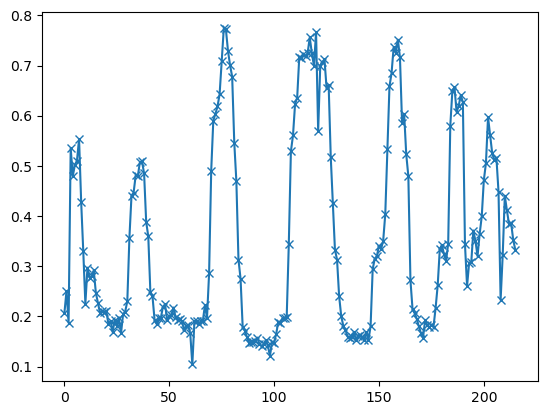

In [17]:
cdts = hdstats.cosdist(data, gm)
edts = hdstats.eucdist(data, gm)
plt.plot(ndvi[yloc,xloc,:], marker='x')



In [18]:
def imshow(data, fs=6, pc=2):
    img = data.copy()
    plt.figure(figsize=(fs,fs*(img.shape[0]/img.shape[1])))

    if len(img.shape) == 3:
        for i in range(min(3, img.shape[2])):
            dd=img[:,:,i]
            pl, pu = np.percentile(dd[np.isfinite(dd)], (pc,100-pc))
            dd[dd<pl], dd[dd>pu] = pl, pu
            dd -= pl
            dd /= (pu - pl)
        plt.imshow(img, aspect='auto')
    else:
        pl, pu = np.percentile(img[np.isfinite(img)], (pc,100-pc))
        plt.imshow(img, aspect='auto', vmin=pl, vmax=pu)
    plt.tick_params(axis='both', which='both', bottom=False, top=False, labelbottom=False, right=False, left=False, labelleft=False)
    plt.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


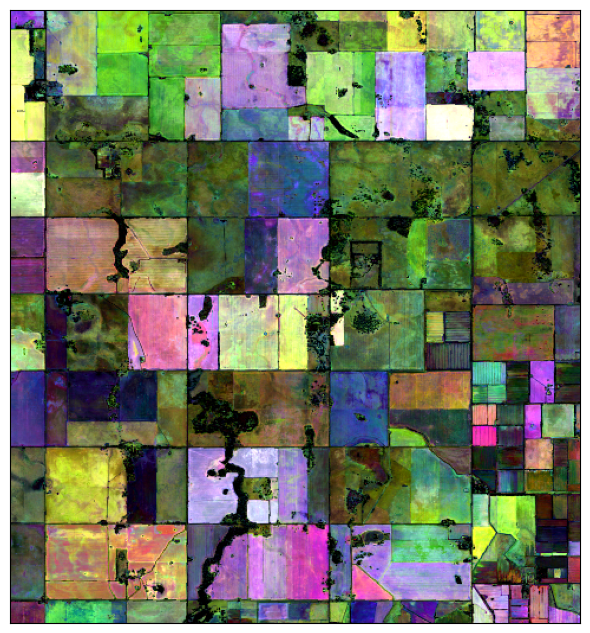

In [19]:
f1 = hdstats.fourier_std(cdts)
imshow(f1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(518, 483, 3)


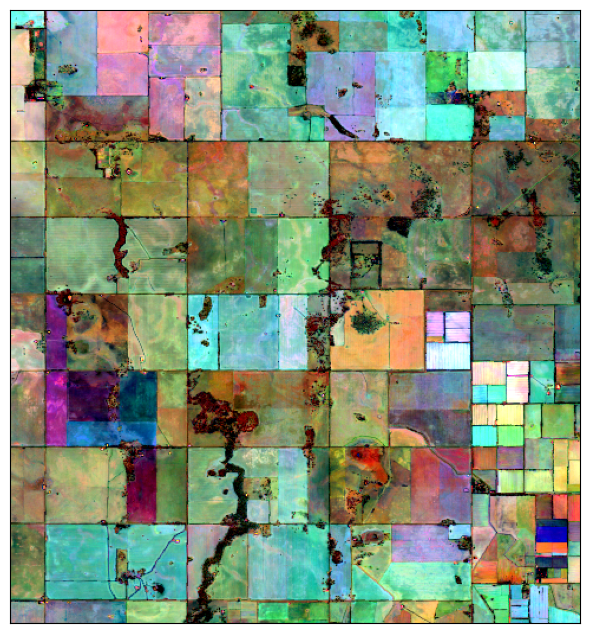

In [20]:
f2 = hdstats.fourier_mean(ndwi)
imshow(f2)
print(f2.shape)

(518, 483, 3)


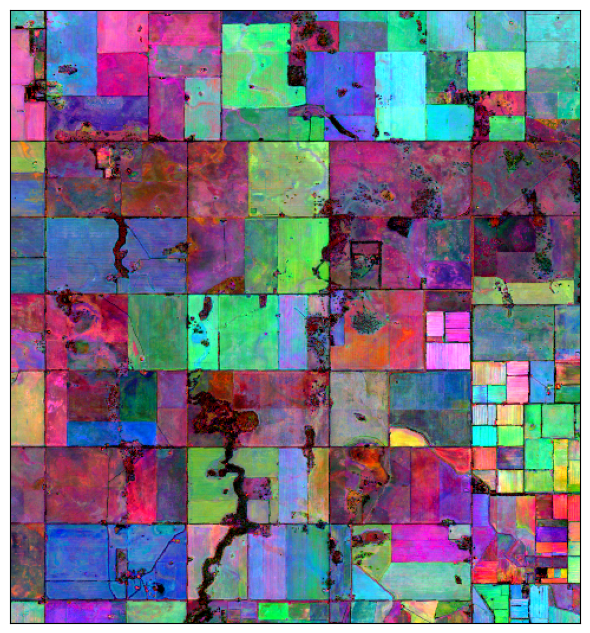

In [21]:
f3 = hdstats.fourier_median(ndvi)
imshow(f3)
print(f3.shape)

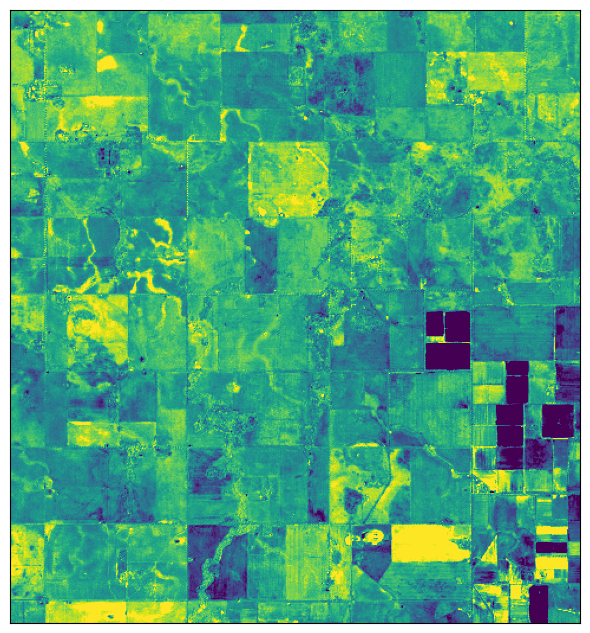

In [22]:
f4 = hdstats.mean_change(ndwi)
imshow(f4)

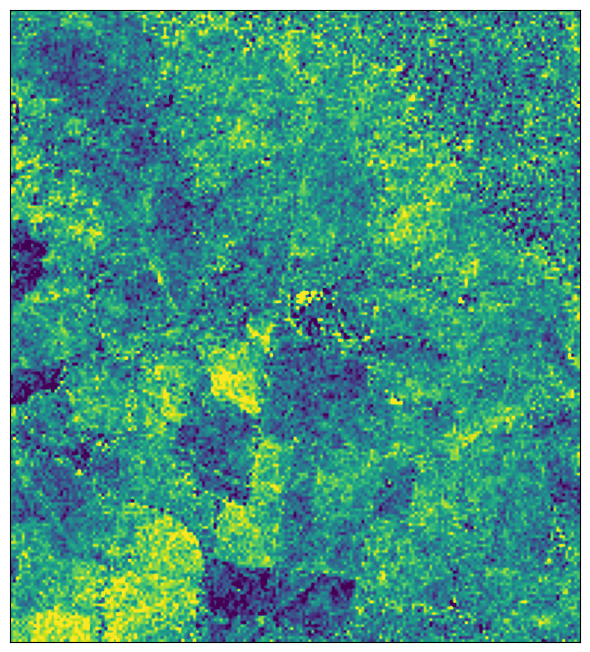

In [107]:
f5 = hdstats.median_change(ndwi)
imshow(f5)

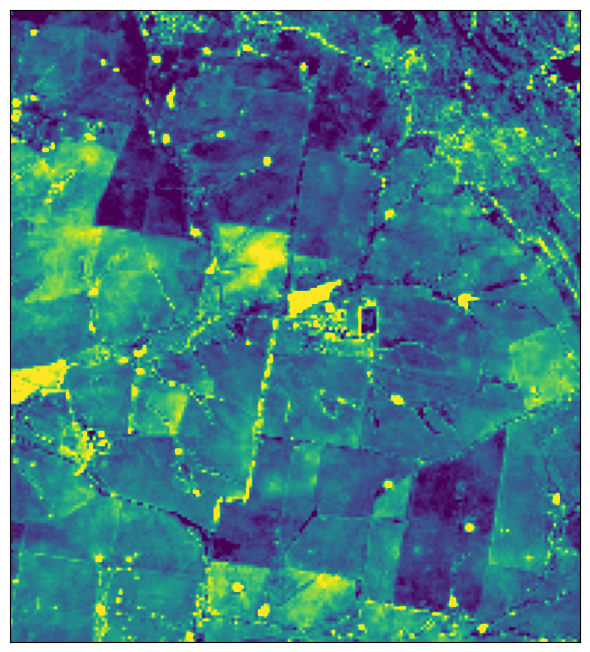

In [108]:
f6 = hdstats.mean_abs_change(ndvi)
imshow(f6)

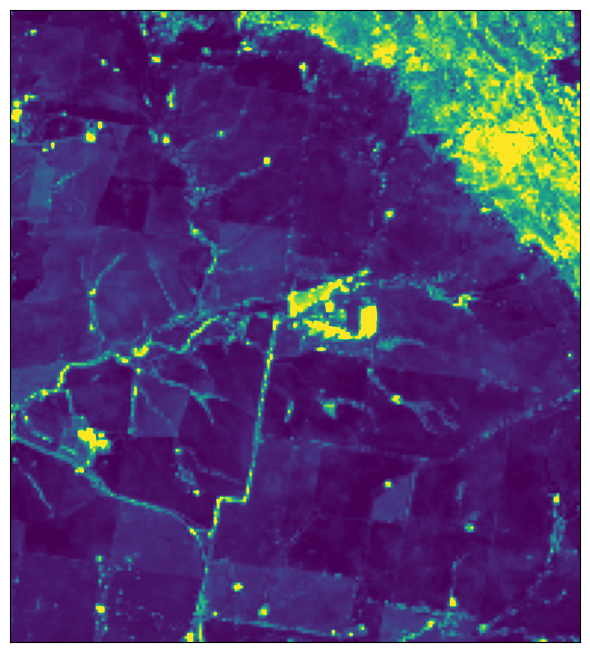

In [109]:
f7 = hdstats.complexity(ndvi)
imshow(f7)

Automatically using 64 threads.


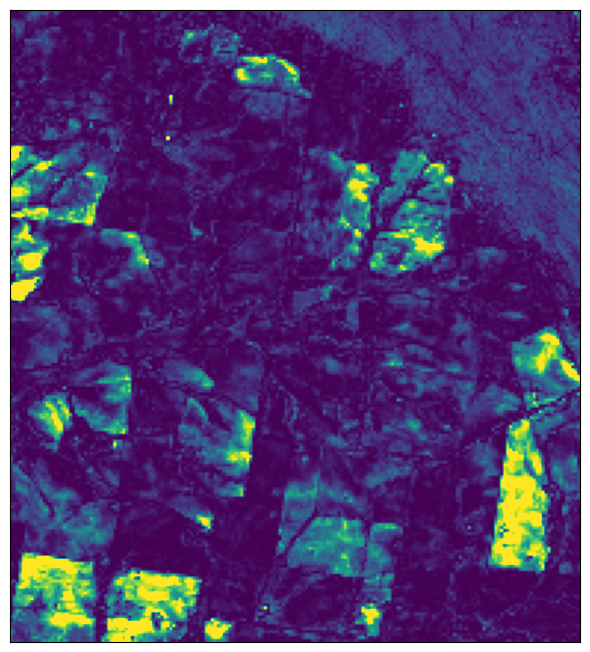

In [110]:
f8 = hdstats.symmetry(data)
imshow(f8)


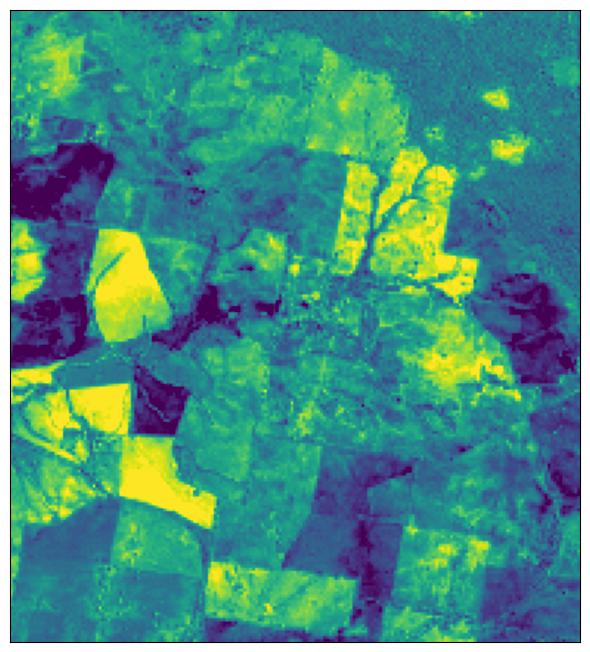

In [111]:
f9 = hdstats.mean_central_diff(ndvi)
imshow(f9)

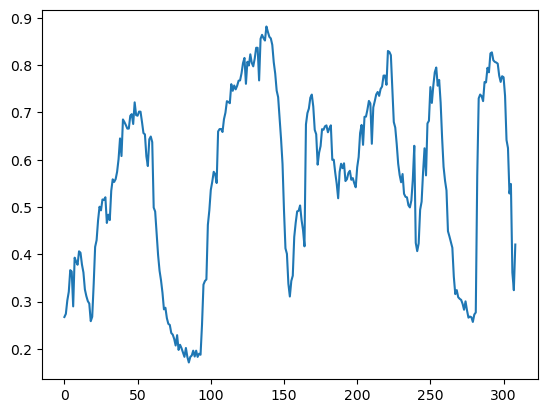

In [112]:
mndvi = np.median(ndvi, axis=(0,1))
plt.plot(mndvi)


In [113]:
hdstats.number_peaks(mndvi[np.newaxis,np.newaxis,:], 100)


array([[6]], dtype=int8)

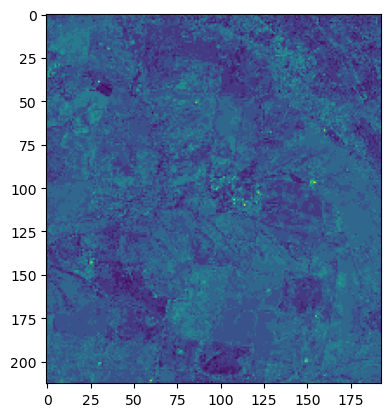

In [117]:
f10 = hdstats.number_peaks(ndvi, 100)
plt.imshow(f10)


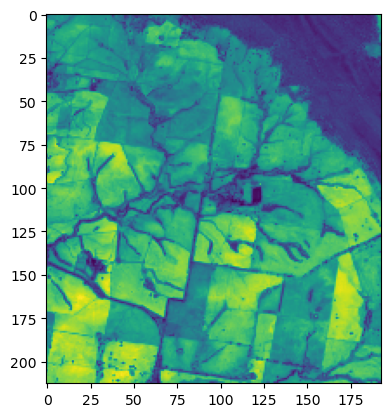

In [118]:
f11 = hdstats.discordance(cdts)
plt.imshow(f11)


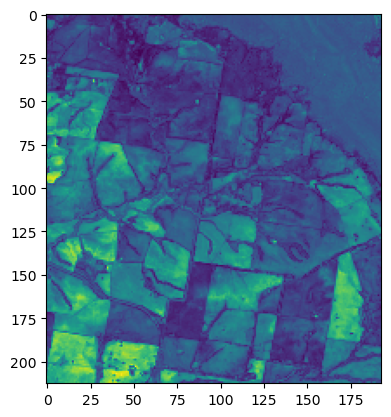

In [119]:
f12 = hdstats.area_warp_similarity(cdts)
plt.imshow(f12)


In [120]:
img = np.dstack([f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12])


In [121]:
img[np.isnan(img)] = 0.0


In [122]:
np.count_nonzero(np.isnan(img))


0

In [123]:
A = img.reshape((-1, img.shape[-1]))


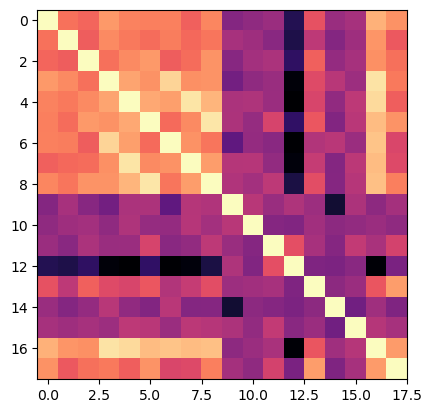

In [124]:
plt.imshow(np.corrcoef(A.T), cmap=plt.cm.magma)


In [125]:
X = img.reshape((-1, img.shape[-1])).copy()
print(X.shape)


mask = np.isfinite(img).all(axis=2)
print(mask.shape)

img[mask] = 0.0


(41109, 18)
(213, 193)


In [126]:
from sklearn.pipeline import Pipeline
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA, FactorAnalysis

nfeatures = X.shape[1]
ninitclass = 20

pipeline = []

pca = PCA(n_components=int(0.9*nfeatures), svd_solver="randomized", whiten=True)
pipeline.append(("pca", pca))

gmm = GaussianMixture(n_components=ninitclass, covariance_type="diag", verbose=True, init_params="random")

pipeline.append(("gmm", gmm))

classifier = Pipeline(pipeline)

classifier.fit(X[mask.flat])


Initialization 0
  Iteration 10
  Iteration 20
  Iteration 30
  Iteration 40
Initialization converged: True


Pipeline(steps=[('pca',
                 PCA(n_components=16, svd_solver='randomized', whiten=True)),
                ('gmm',
                 GaussianMixture(covariance_type='diag', init_params='random',
                                 n_components=20, verbose=True))])

In [127]:
ppca = PCA(n_components=int(0.9*nfeatures), svd_solver="randomized", whiten=True)
drimg = ppca.fit_transform(X).reshape((img.shape[0],img.shape[1], pca.n_components))

In [128]:
pca

PCA(n_components=16, svd_solver='randomized', whiten=True)

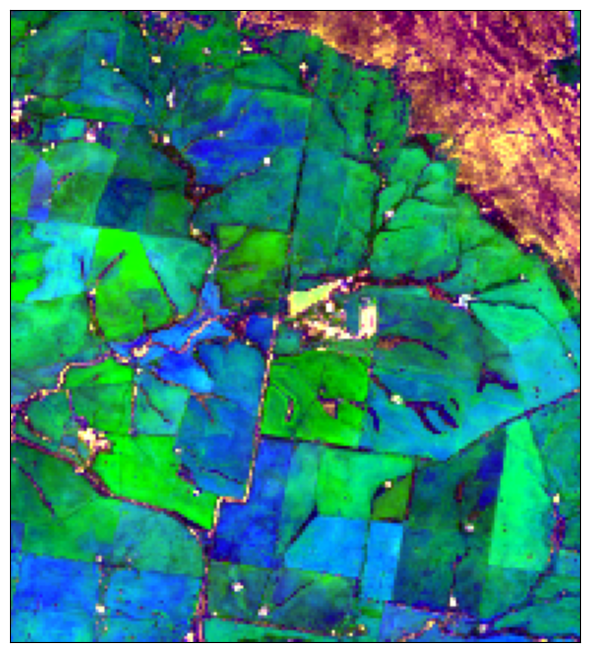

In [129]:
imshow(drimg[:,:,:3]);


In [130]:
labels = np.zeros((img.shape[0], img.shape[1]), dtype=np.uint8)
labels[mask] = classifier.predict(X[mask.flat])

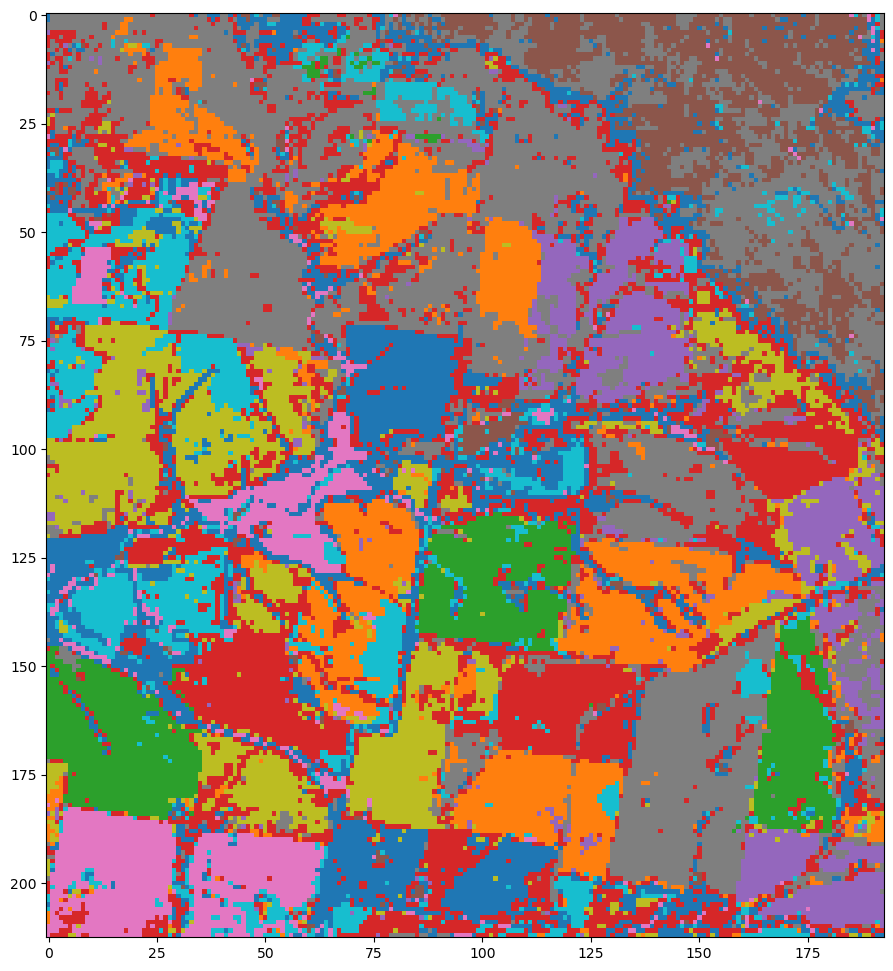

In [131]:
plt.figure(figsize=(12,12))
plt.imshow(labels, cmap=plt.cm.tab10)

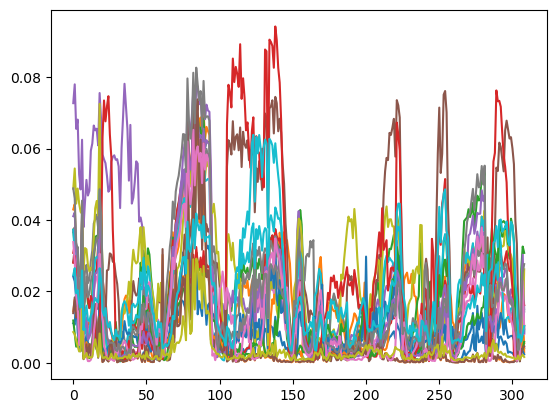

In [132]:
for i in np.unique(labels):
    plt.plot(np.median(cdts[labels==i,:], axis=0), label=i)
#plt.legend()

In [136]:
cdts.shape

(213, 193, 309)

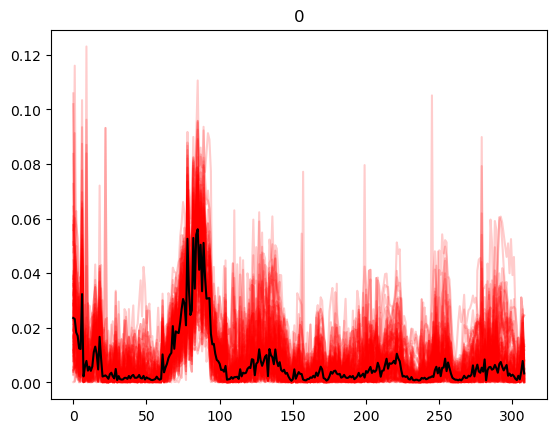

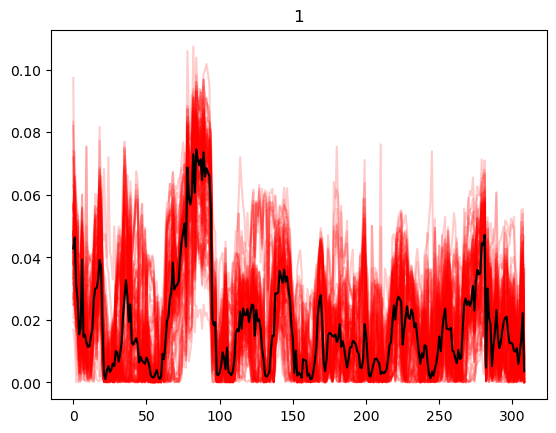

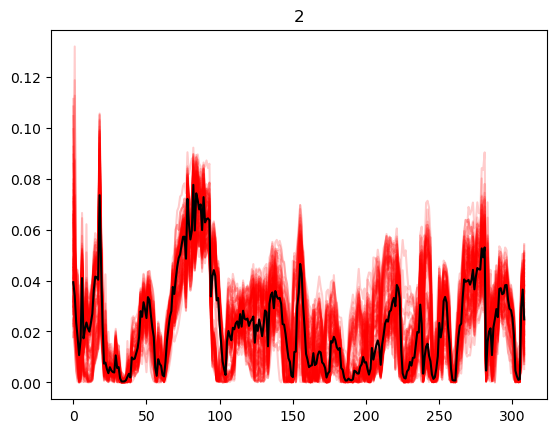

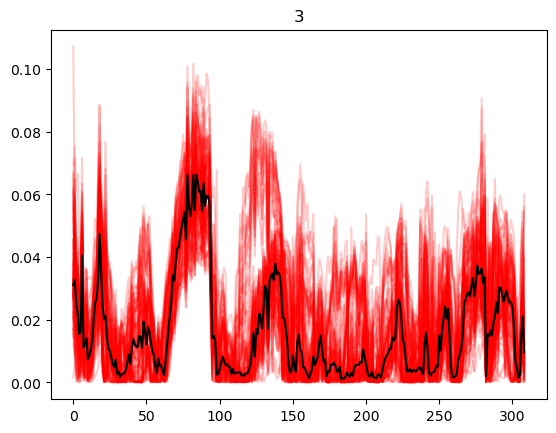

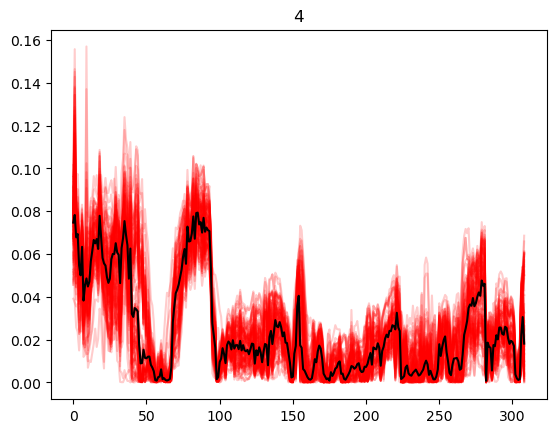

...

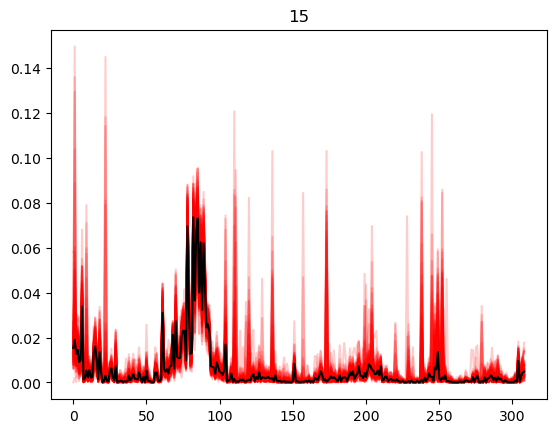

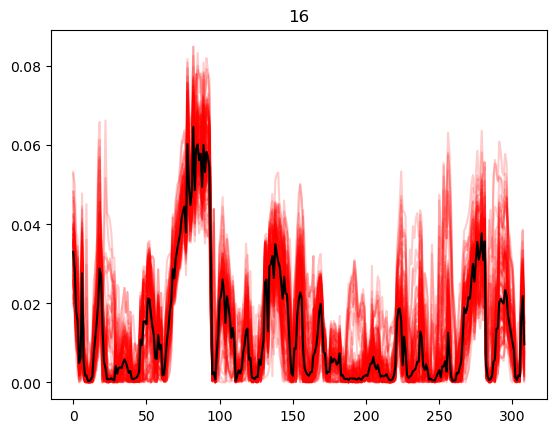

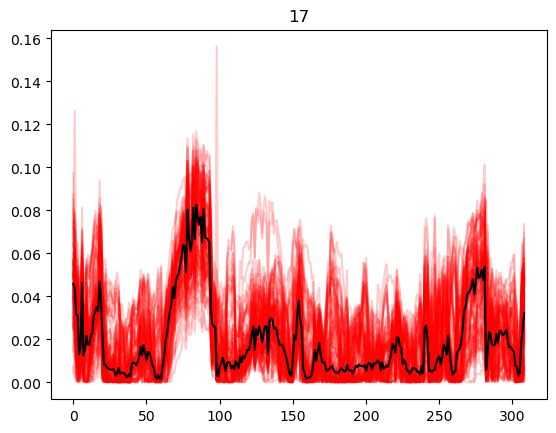

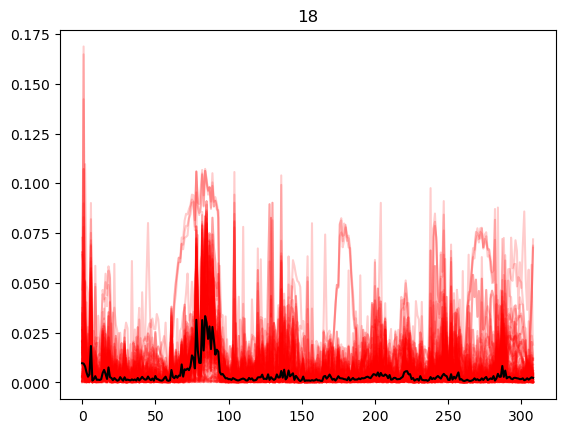

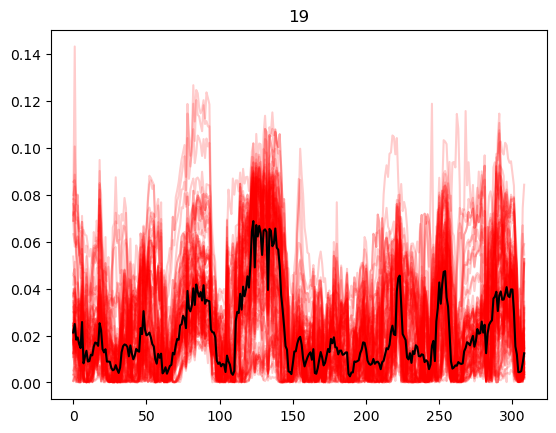

In [134]:
for k in np.unique(labels):
    series = cdts[labels==k,:]
    idxs = np.random.randint(0, series.shape[0], size=100)
    t = range(series.shape[1])
    plt.figure()
    for ts in series[idxs]:
        plt.plot(t, ts, color='r', alpha=0.2)
    plt.plot(t, np.median(series[idxs], axis=0), color='k')
    plt.title(k)

In [27]:
### take 3 single band images as an RGB stack, run SAMGeo

b1 = hdstats.fourier_mean(ndwi)
b2 = hdstats.discordance(cdts)
b3 = drimg

print(b1.shape, b2.shape, b3.shape)

# ^^ many of these are multiband images. Just take the first 3 PCs:

print(drimg[:,:,:3].shape)

im = drimg[:,:,:3]

NameError: name 'drimg' is not defined

### Important step:
Create a rescaled RGB image from the Forier Transform layer that can be used by SAMGeo

In [25]:
# rescale each band of a numpy array so that it's between 0 and 255

def rescale(im):
    
    '''rescale raster (im) to between 0 and 255.
    Attempts to rescale each band separately, then join them back together to achieve exact same shape as input.
    Note. Assumes multiple bands, otherwise breaks'''
    
    n_bands = im.shape[2]
    #print(n_bands)

    #print(im.shape)

    _im = np.empty(im.shape)

    #print(_im)
    for n in range(0,n_bands):

        #print(n)

        matrix = im[:,:,n]
        scaled_matrix = (255*(matrix - np.min(matrix))/np.ptp(matrix)).astype(int)

        #_im = np.append(_im, scaled_matrix, axis = 0)
        _im[:,:,n] = scaled_matrix

    print('output shape equals input:', im.shape == im.shape)

    imshow(_im)
    
    return(_im)

#t = rescale(drimg[:,:,:3])

In [ ]:
# ## Rescale a 3-band raster and prepare to make it into an xarray object

# # test make xarray spatial
# image = rescale(drimg[:,:,:3]) # 3d array 
# lat = list(ds.y.values) # latitude is the same size as the first axis
# lon = list(ds.x.values) # longitude is the same size as second axis
# bands = list(range(1,image.shape[2]+1)) # band is the 3rd axis
# crs = ds.rio.crs

In [34]:
def export_for_segmentation(ds, inp, out_stub):
    
    '''prepares a 3-band image for SAMgeo. 
    First rescale bands in the image. Then convert to xarray with original geo info. Then save geotif'''
    
    if inp.shape[2] == 3:
    
        image = rescale(inp) # 3d array 
        lat = list(ds.y.values) # latitude is the same size as the first axis
        lon = list(ds.x.values) # longitude is the same size as second axis
        bands = list(range(1,image.shape[2]+1)) # band is the 3rd axis
        crs = ds.rio.crs
                
        # create xarray object
        data_xr = xr.DataArray(image, 
                       coords={'y': lat,'x': lon,'band': bands}, 
                       dims=["y", "x", "band"])

        data_xr.rio.write_crs(crs, inplace=True)
        
        # save as geotif:
        data_xr.transpose('band', 'y', 'x').rio.to_raster(out_stub + '.tif')

    else:
        print("Input image is wrong shape! No action taken")
        
    #return(image, data_xr)



output shape equals input: True


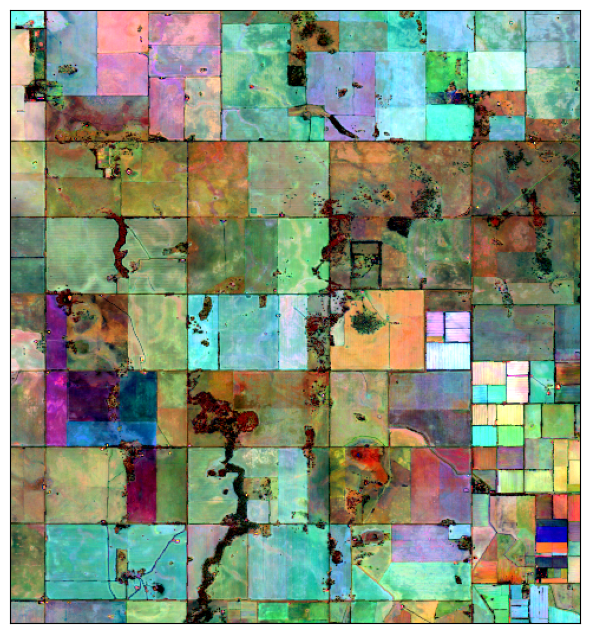

In [35]:
### Set the stub name and export the ds for later analysis as well as an RGB for segmentation with SAMGeo

stub = 'GRANT'
out_path = '/home/jovyan/Projects/PaddockTS/Data/Paddocks/'

export_for_segmentation(ds, f2, out_path+stub)

In [ ]:
### Next importand step in outputs:

In [126]:
# create new xarray object

data_xr = xr.DataArray(image, 
                       coords={'y': lat,'x': lon,'band': bands}, 
                       dims=["y", "x", "band"])

data_xr.rio.write_crs(crs, inplace=True)

data_xr.rio.crs

CRS.from_epsg(6933)

In [127]:
# # maybe easiest way to make new xarray is to modify the input...

# names = [i for i in ds.data_vars]

# ds_ = ds.drop_vars('time').reset_coords([i for i in ds.data_vars], drop=True)
# ds_

In [128]:
data_xr.transpose('band', 'y', 'x').rio.to_raster('MILG_output.tif')

data_xr

<xarray.DataArray (y: 159, x: 145, band: 3)>
array([[[  5.,  66., 135.],
        [  4.,  63., 132.],
        [  4.,  60., 133.],
        ...,
        [ 49.,  48.,  72.],
        [ 64.,  65.,  82.],
        [ 63.,  65.,  78.]],

       [[  5.,  69., 130.],
        [  5.,  67., 125.],
        [  4.,  66., 126.],
        ...,
        [ 54.,  53.,  78.],
        [ 75.,  75.,  89.],
        [ 57.,  56.,  78.]],

       [[  4.,  72., 114.],
        [  4.,  77., 123.],
        [  6.,  70., 122.],
        ...,
...
        ...,
        [  6., 108., 126.],
        [  5., 100., 126.],
        [  6., 105., 122.]],

       [[  3.,  93.,  88.],
        [  4.,  90.,  94.],
        [  6.,  84., 104.],
        ...,
        [  7., 108., 119.],
        [  7., 104., 122.],
        [  8., 106., 122.]],

       [[  6.,  79.,  98.],
        [  6.,  86.,  96.],
        [  6.,  93.,  89.],
        ...,
        [  7.,  99., 122.],
        [  8., 103., 122.],
        [  8., 107., 125.]]])
Coordinates:
  * y            (y) float64 -4.133e+06 -4.133e+06 ... -4.136e+06 -4.136e+06
  * x            (x) float64 1.432e+07 1.432e+07 ... 1.433e+07 1.433e+07
  * band         (band) int64 1 2 3
    spatial_ref  int64 0

#### Next
Try dynamic time warp clustering following Dale's sript

In [143]:
ndviphenos = [np.mean(ndvi[labels==i,:], axis=0).reshape(1,-1) for i in range(ninitclass)]
len(ndviphenos)

20

In [144]:
nndviphenos = len(ndviphenos)
DM = np.zeros((nndviphenos, nndviphenos))
for i in range(nndviphenos):
    for j in range(i, nndviphenos):
        DM[i,j] = hdstats.dtw_dist(ndviphenos[i], ndviphenos[j])
DM = DM + DM.T

NameError: name 'ndviphenos' is not defined

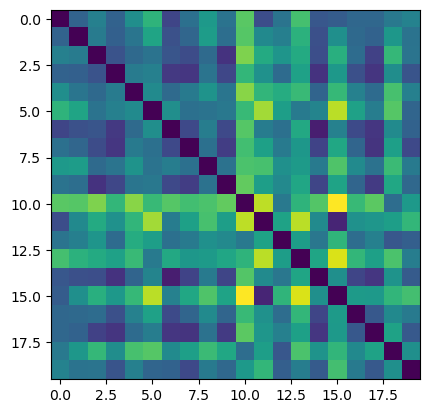

In [145]:
plt.imshow(DM)


In [147]:
phenos = [np.mean(cdts[labels==i,:], axis=0).reshape(1,-1) for i in range(ninitclass)]
len(phenos)

20

In [148]:
nphenos = len(phenos)
DM = np.zeros((nphenos, nphenos))
for i in range(nphenos):
    for j in range(i, nphenos):
        DM[i,j] = hdstats.dtw_dist(phenos[i], phenos[j])
DM = DM + DM.T

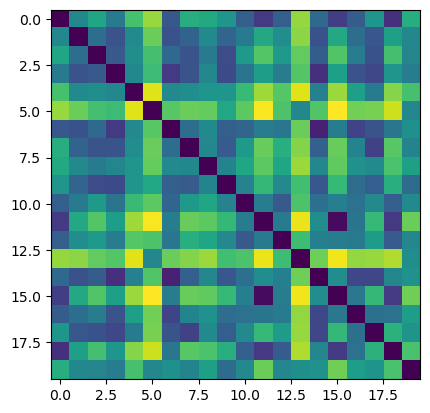

In [149]:
plt.imshow(DM)


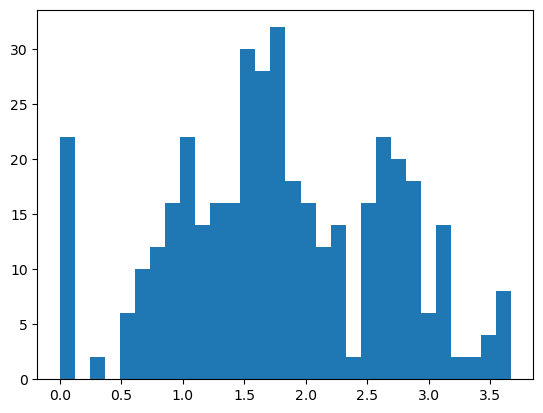

In [150]:
plt.hist(DM.flat, 30);


In [151]:
for i, j in np.argwhere(DM < 0.10):
    labels[labels == j] = i


In [152]:
classes = np.unique(labels)
print(len(classes), '::', classes)

20 :: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]


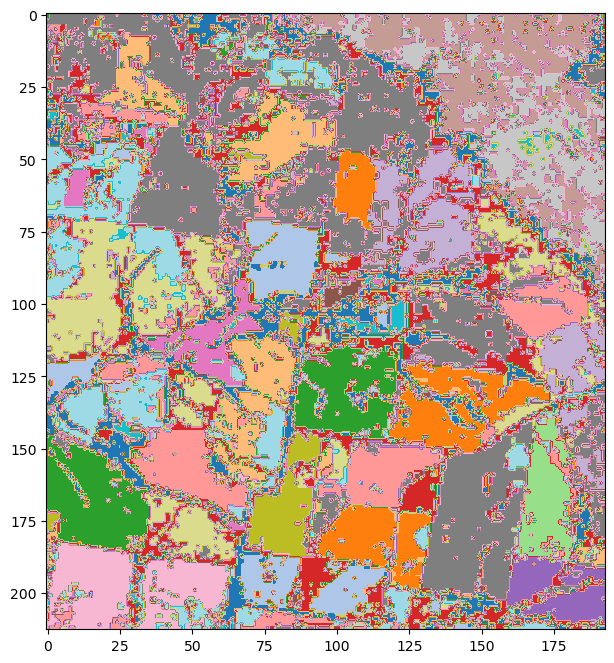

In [155]:
plt.figure(figsize=(8,8))
if len(classes) < 10:
    plt.imshow(labels, cmap=plt.cm.tab10)
else:
    plt.imshow(labels, cmap=plt.cm.tab20)

In [156]:
from skimage.morphology import label, binary_closing, binary_opening, diamond, disk

clabels = np.zeros_like(labels)
lbls = np.argsort([np.count_nonzero(labels == i) for i in np.unique(labels)])
for k in lbls:
    lmask = labels == k
    lmask = binary_closing(lmask, disk(1.8)) # try differnt params in binary_closing e.g. diamond(1), disk(1)
    clabels[lmask] = k

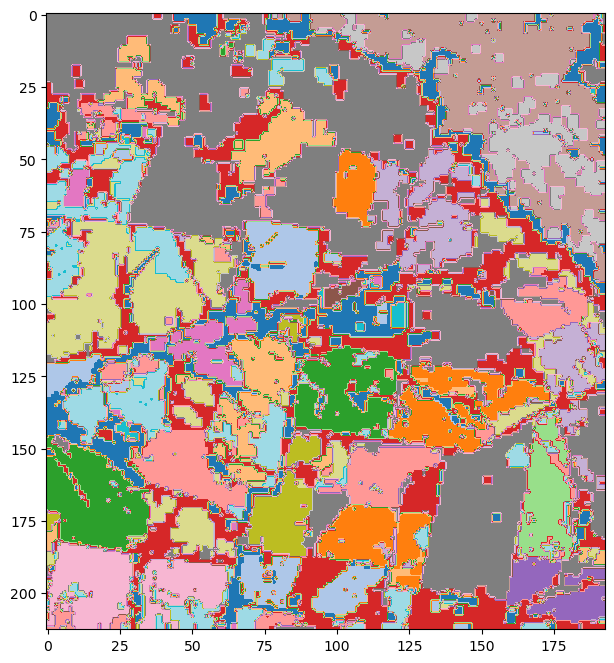

In [157]:
plt.figure(figsize=(8,8))
if len(classes) < 20:
    plt.imshow(clabels, cmap=plt.cm.tab10)
else:
    plt.imshow(clabels, cmap=plt.cm.tab20)

In [158]:
ntc = np.empty((ndvi.shape[0], ndvi.shape[1], len(phenos)), dtype=np.float32)
for k in range(ntc.shape[2]):
    print(k)
    for i in range(ntc.shape[0]):
        for j in range(ntc.shape[1]):
            ntc[i,j,k] = hdstats.dtw_dist(ndvi[i,j,:].reshape(1,-1), phenos[k])

mntc = np.argmin(ntc, axis=2)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


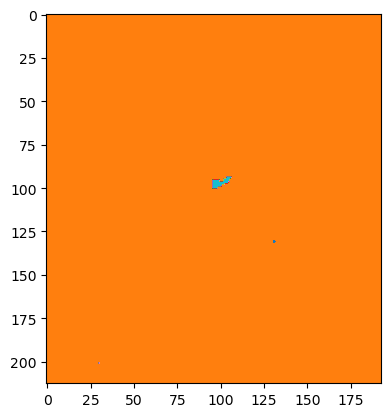

In [159]:
plt.imshow(mntc, cmap=plt.cm.tab10)


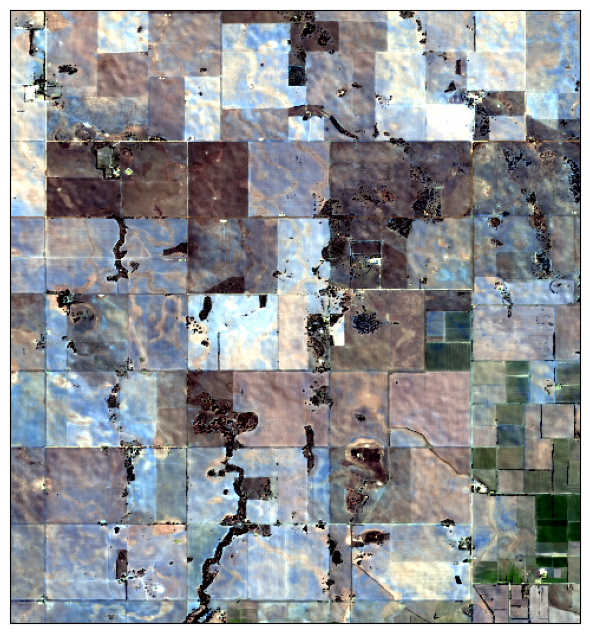

In [33]:
imshow(gm[:,:,[2,1,0]]);

# potentially gm is a good one to plot for time lapse... 


In [162]:
dtwlabels = np.zeros_like(mntc)
lbls = np.argsort([np.count_nonzero(mntc == i) for i in np.unique(mntc)])
for k in lbls:
    lmask = mntc == k
    lmask = binary_closing(lmask, diamond(0))
    dtwlabels[lmask] = k

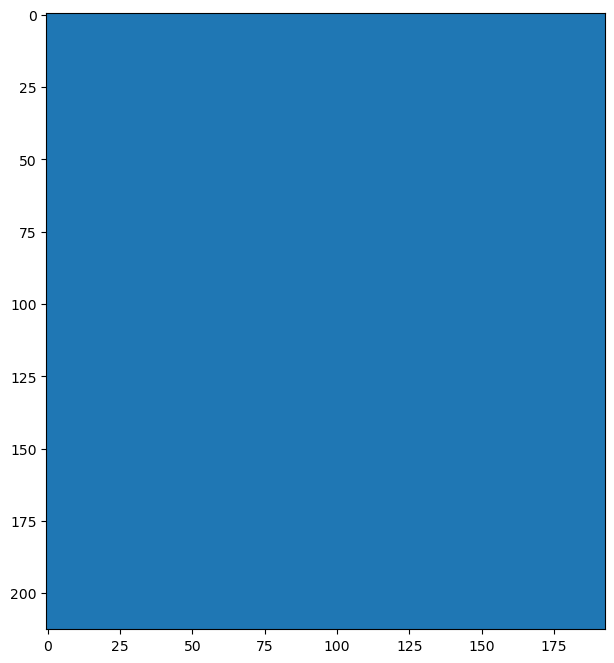

In [163]:
plt.figure(figsize=(8,8))
plt.imshow(dtwlabels, cmap=plt.cm.tab20)
#plt.colorbar()

### Next step. Time series summary and extraction at paddock level
1. Load polygons generated by segment anything 
2. extract spectral time series summaries for each polyon
3. Save crucial files for next  script



In [39]:
import geopandas as gpd
import pandas as pd
import numpy as np

out_path

'/home/jovyan/Projects/PaddockTS/Data/Paddocks/'

<Axes: >

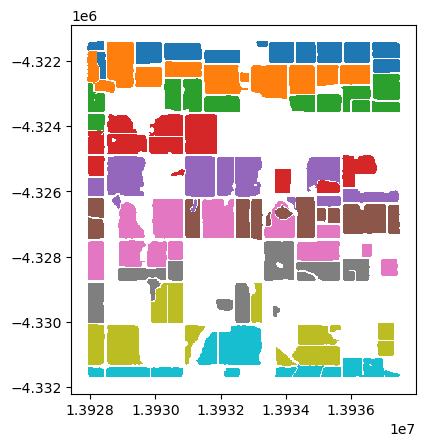

In [40]:
#data_dir = 'Data/Paddocks/'

stub = 'MILG_small'
stub = 'fm_ndwi_4'
stub = 'ADAMO'
stub = 'GRANT'

pol = gpd.read_file(out_path+stub+'_filt.gpkg')

pol['paddock'] = range(1,len(pol)+1)
pol['paddock'] = pol.paddock.astype('category')

pol.plot(column = 'paddock')

In [41]:
gdf = pol
gdf.explore(column='paddock') # note, I think column must be categorical for this... 

In [10]:
## TESTING:

# ts = []

# for datarow in pol[0:3].itertuples(index=True):
    
#     #print(datarow)
    
#     ds_clipped = ds['nbart_red'].rio.clip([datarow.geometry])
    
#     pol_ts = ds_clipped.where(ds_clipped > 0).median(dim = ['x','y']).values
    
#     #ts = np.append(ts, pol_ts, axis = 0)
    
#     ts.append(pol_ts)
    
# pvt = np.vstack(ts)


# ### This gives the median paddock pixel per time step. Do this for NDVI or other indices. Apply for all paddocks, and then do ts clustering. 

# ### Also, stretch it a daily vector and apply interpolation. 


In [16]:
#ds.rio.clip([datarow.geometry])


In [42]:
# add some indices to the data
ds_indi = calculate_indices(ds, index=['NDVI','NDWI'], collection='ga_s2_3') # calculate indices using the DEA tool. # calculate indices using the DEA tool.

ds_indi


<xarray.Dataset>
Dimensions:      (time: 216, y: 518, x: 483)
Coordinates:
  * time         (time) datetime64[ns] 2017-01-11T00:24:25.608000 ... 2024-02...
  * y            (y) float64 -4.321e+06 -4.321e+06 ... -4.332e+06 -4.332e+06
  * x            (x) float64 1.393e+07 1.393e+07 ... 1.394e+07 1.394e+07
    spatial_ref  int32 6933
Data variables:
    nbart_red    (time, y, x) float32 1.421e+03 1.457e+03 ... 1.464e+03 1.5e+03
    nbart_green  (time, y, x) float32 1.01e+03 1.029e+03 ... 1.018e+03 1.037e+03
    nbart_blue   (time, y, x) float32 736.0 715.0 764.0 ... 738.0 764.0 729.0
    nbart_nir_1  (time, y, x) float32 2.032e+03 2.039e+03 ... 2.31e+03 2.377e+03
    NDVI         (time, y, x) float32 0.1769 0.1665 0.1902 ... 0.2242 0.2262
    NDWI         (time, y, x) float32 -0.336 -0.3292 -0.3398 ... -0.3882 -0.3925
Attributes:
    crs:           epsg:6933
    grid_mapping:  spatial_ref

In [43]:
# Loop through every polygon and extract the smoothed time series for some number of bands. 

ts = []

for datarow in pol.itertuples(index=True):
    
    #print(datarow)
    
    ds_clipped = ds_indi.rio.clip([datarow.geometry])
    
    pol_ts = ds_clipped.where(ds_clipped > 0).median(dim = ['x','y'])
    
    array = pol_ts.to_array().transpose('variable', 'time').values.astype(np.float32)
    
    ts.append(array[None,:] )
        
pvt = np.vstack(ts)

In [45]:
# the result is an array of paddocks by variable (e.g. band) by time
# use ds.time and ds.geometry to bring in the time axis in proper format and location for each paddock
print(pvt.shape)
print(len(pol.geometry), len(ds.time))

np.save(out_path+stub+'_pvt', pvt, allow_pickle=True, fix_imports=True)


(119, 6, 216)
119 216


<Axes: >

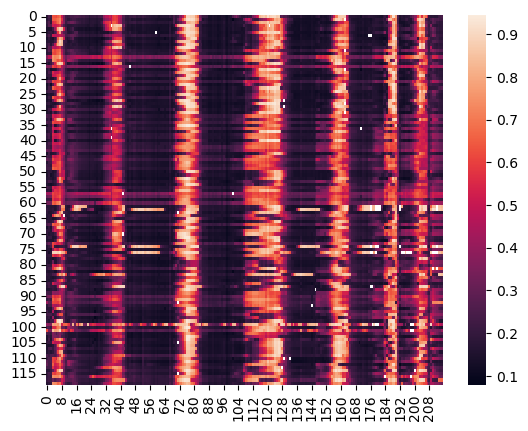

In [46]:
import seaborn as sns

pvt_ndvi = pvt[:,4,:]

sns.heatmap(pvt_ndvi)

In [47]:
ds.assign_coords

<bound method DataWithCoords.assign_coords of <xarray.Dataset>
Dimensions:      (time: 216, y: 518, x: 483)
Coordinates:
  * time         (time) datetime64[ns] 2017-01-11T00:24:25.608000 ... 2024-02...
  * y            (y) float64 -4.321e+06 -4.321e+06 ... -4.332e+06 -4.332e+06
  * x            (x) float64 1.393e+07 1.393e+07 ... 1.394e+07 1.394e+07
    spatial_ref  int32 6933
Data variables:
    nbart_red    (time, y, x) float32 1.421e+03 1.457e+03 ... 1.464e+03 1.5e+03
    nbart_green  (time, y, x) float32 1.01e+03 1.029e+03 ... 1.018e+03 1.037e+03
    nbart_blue   (time, y, x) float32 736.0 715.0 764.0 ... 738.0 764.0 729.0
    nbart_nir_1  (time, y, x) float32 2.032e+03 2.039e+03 ... 2.31e+03 2.377e+03
Attributes:
    crs:           epsg:6933
    grid_mapping:  spatial_ref>

In [43]:

# # NO LONGER NEEDED?


# # save the time axis of the ds array as a csv so it can be opened as a pd.series

# pd.Series(ds.time.values).to_csv('Data/'+stub+'_ds-time.csv',
#                                 header = False,
#                                 mode = 'w',
#                                 index_label = 'False')


In [50]:
# make a copy of the ds next time!!
ds_ = ds

ds_.time.attrs.pop('units', None)
ds_.to_netcdf(out_path+stub+'_ds.nc')



In [51]:
ds_

<xarray.Dataset>
Dimensions:      (time: 216, y: 518, x: 483)
Coordinates:
  * time         (time) datetime64[ns] 2017-01-11T00:24:25.608000 ... 2024-02...
  * y            (y) float64 -4.321e+06 -4.321e+06 ... -4.332e+06 -4.332e+06
  * x            (x) float64 1.393e+07 1.393e+07 ... 1.394e+07 1.394e+07
    spatial_ref  int32 6933
Data variables:
    nbart_red    (time, y, x) float32 1.421e+03 1.457e+03 ... 1.464e+03 1.5e+03
    nbart_green  (time, y, x) float32 1.01e+03 1.029e+03 ... 1.018e+03 1.037e+03
    nbart_blue   (time, y, x) float32 736.0 715.0 764.0 ... 738.0 764.0 729.0
    nbart_nir_1  (time, y, x) float32 2.032e+03 2.039e+03 ... 2.31e+03 2.377e+03
Attributes:
    crs:           epsg:6933
    grid_mapping:  spatial_ref

In [54]:
ds

<xarray.Dataset>
Dimensions:      (time: 216, y: 518, x: 483)
Coordinates:
  * time         (time) datetime64[ns] 2017-01-11T00:24:25.608000 ... 2024-02...
  * y            (y) float64 -4.321e+06 -4.321e+06 ... -4.332e+06 -4.332e+06
  * x            (x) float64 1.393e+07 1.393e+07 ... 1.394e+07 1.394e+07
    spatial_ref  int32 6933
Data variables:
    nbart_red    (time, y, x) float32 1.421e+03 1.457e+03 ... 1.464e+03 1.5e+03
    nbart_green  (time, y, x) float32 1.01e+03 1.029e+03 ... 1.018e+03 1.037e+03
    nbart_blue   (time, y, x) float32 736.0 715.0 764.0 ... 738.0 764.0 729.0
    nbart_nir_1  (time, y, x) float32 2.032e+03 2.039e+03 ... 2.31e+03 2.377e+03
Attributes:
    crs:           epsg:6933
    grid_mapping:  spatial_ref